In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import requests
import distinctipy
import json
import config
from bs4 import BeautifulSoup
from shapely.geometry import Point, Polygon
from bng_latlon import OSGB36toWGS84
from numpy import unique
from numpy import where
from scipy.spatial import ConvexHull
from sklearn.mixture import GaussianMixture
from scipy import interpolate
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
import tensorflow as tf

2023-11-04 17:46:05.417722: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-04 17:46:05.563988: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-04 17:46:05.564041: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-04 17:46:05.565151: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-04 17:46:05.641018: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-04 17:46:05.641645: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

# Data Checking/Cleaning

In [2]:
london_weekends = pd.read_csv("london_weekends.csv", index_col=[0])

london_weekends.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat
0,121.122322,Private room,False,True,2.0,False,0,0,6.0,69.0,1,5.734117,0.437094,222.882243,15.493414,470.088502,8.413765,-0.04975,51.52570
1,195.912416,Private room,False,True,2.0,False,1,0,10.0,96.0,1,4.788905,1.464050,235.385841,16.362588,530.133525,9.488466,-0.08475,51.54210
2,193.325337,Private room,False,True,3.0,False,1,0,10.0,95.0,1,4.596677,0.450306,268.913812,18.693247,548.987610,9.825922,-0.14585,51.54802
3,180.389943,Private room,False,True,2.0,False,1,0,9.0,87.0,1,2.054769,0.132670,472.381314,32.837067,1021.271062,18.278973,-0.10611,51.52108
4,405.700981,Entire home/apt,False,False,3.0,False,0,1,7.0,65.0,0,4.491277,0.354108,318.491470,22.139584,692.775411,12.399473,-0.18797,51.49399


In [3]:
# The below is to check if the room_type category is redundant

expected_relationships = {
    "Private room": {"room_shared": False, "room_private": True},
    "Shared room": {"room_shared": True, "room_private": False},
    "Entire home/apt": {"room_shared": False, "room_private": False}
}

# Create a mask for each relationship
masks = [
    (london_weekends["room_type"] == room_type) & 
    (london_weekends["room_shared"] == expected_values["room_shared"]) &
    (london_weekends["room_private"] == expected_values["room_private"])
    for room_type, expected_values in expected_relationships.items()
]

combined_mask = pd.concat(masks, axis=1).any(axis=1)

# Check for inconsistencies
inconsistent_rows = london_weekends[~combined_mask]

if not inconsistent_rows.empty:
    print("Column is NECESSARY")
    print(inconsistent_rows)
else:
    print("Column is REDUNDANT")

Column is REDUNDANT


While the `room_type` column is essentially one hot encoded by `room_private` and `room_shared`, it will not be removed as XGBoost has experimental support for categorical variables.

In [4]:
# The below is to check if the multi or biz categories are redundant

print((london_weekends['multi'] ^ london_weekends['biz']).all())

False


In [5]:
# Drop redundant/not useful columns

london_weekends.drop(['attr_index', 'attr_index_norm', 'rest_index', 'rest_index_norm'], axis=1, inplace=True)

# Change True/False columns to 0/1 columns

london_weekends[['room_shared', 'room_private', 
                 'host_is_superhost']] = london_weekends[['room_shared', 
                                                          'room_private', 'host_is_superhost']].astype(int)

london_weekends.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
0,121.122322,Private room,0,1,2.0,0,0,0,6.0,69.0,1,5.734117,0.437094,-0.04975,51.52570
1,195.912416,Private room,0,1,2.0,0,1,0,10.0,96.0,1,4.788905,1.464050,-0.08475,51.54210
2,193.325337,Private room,0,1,3.0,0,1,0,10.0,95.0,1,4.596677,0.450306,-0.14585,51.54802
3,180.389943,Private room,0,1,2.0,0,1,0,9.0,87.0,1,2.054769,0.132670,-0.10611,51.52108
4,405.700981,Entire home/apt,0,0,3.0,0,0,1,7.0,65.0,0,4.491277,0.354108,-0.18797,51.49399


In [6]:
# Check for any nan values

print("There are {} values".format("NaN" if london_weekends.isnull().any().any() else "no NaN"))

# Check if values in the dataframe are only numbers

print("There are {} values"
      .format("only numeric" if london_weekends.select_dtypes(include=['float32']).empty else "non-numeric"))


# Check if values for room_shared, room_private, host_is_superhost, multi, and biz categories are only binary

print("There are {} values in room_shared, room_private, host_is_superhost, multi, and biz categories"
      .format("only binary" if london_weekends[['room_shared', 'room_private', 
                                                'host_is_superhost', 'multi', 'biz']]
              .isin([0, 1]).all().all() else "non-binary"))

# Check that every column other than lng and lat have non negative values 

print("There are {}negative non-coordinate values".format("no " if 
                                (london_weekends.drop(['lat', 'lng', 
                                                       'room_type'], axis=1) >= 0).all().all() else ""))

There are no NaN values
There are only numeric values
There are only binary values in room_shared, room_private, host_is_superhost, multi, and biz categories
There are no negative non-coordinate values


# EDA

In [7]:
room_type_counts = london_weekends['room_type'].value_counts()
room_type_values = room_type_counts.index.tolist()
room_type_freqs = room_type_counts.values.tolist()

room_type_counts

room_type
Private room       2934
Entire home/apt    2418
Shared room          27
Name: count, dtype: int64

(0.0, 3000.0)

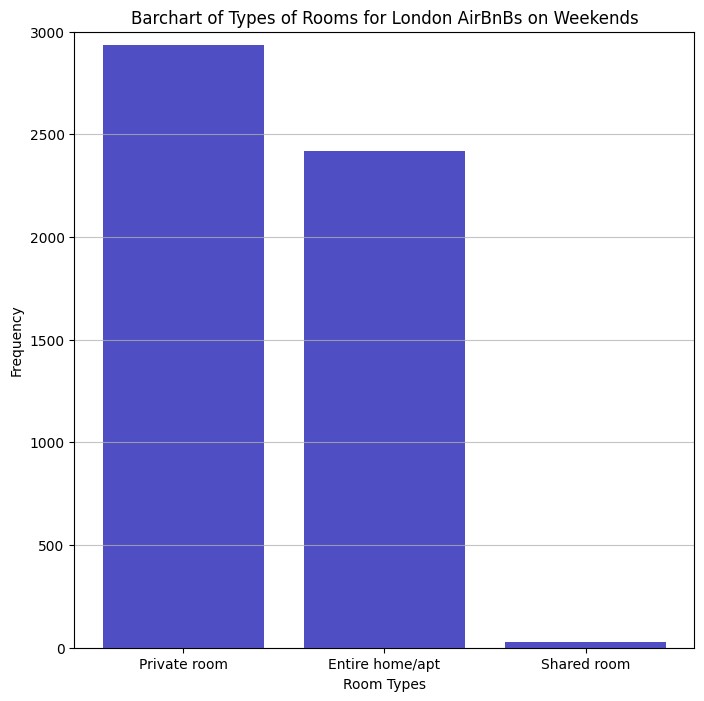

In [8]:
plt.rcParams['figure.figsize']=(8,8)
plt.bar(room_type_values, room_type_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Room Types')
plt.ylabel('Frequency')
plt.title('Barchart of Types of Rooms for London AirBnBs on Weekends')

plt.ylim(ymax=3000)

In [9]:
superhost_counts = london_weekends['host_is_superhost'].value_counts()
superhost_values = superhost_counts.index.tolist()
superhost_freqs = superhost_counts.values.tolist()

superhost_counts

host_is_superhost
0    4484
1     895
Name: count, dtype: int64

(0.0, 5000.0)

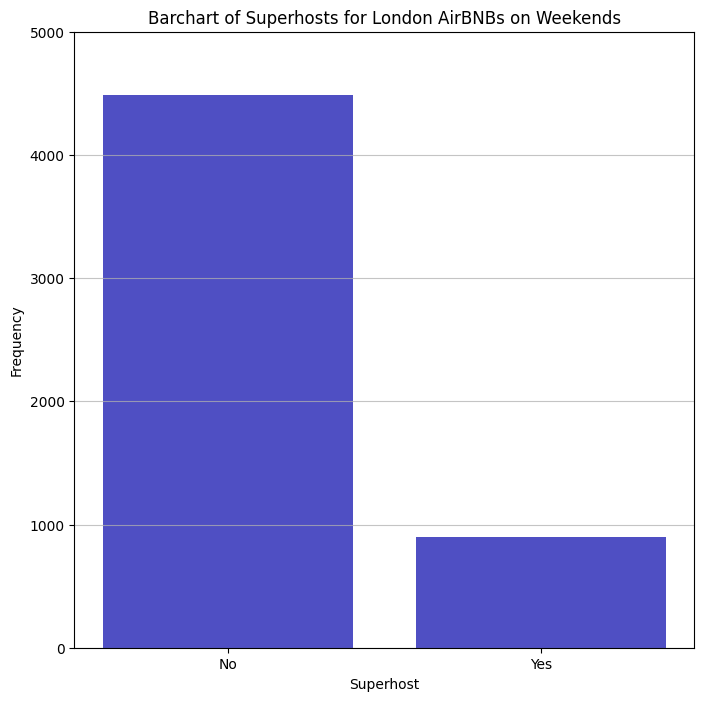

In [10]:
plt.rcParams['figure.figsize']=(8,8)
plt.bar(superhost_values, superhost_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Superhost')
plt.ylabel('Frequency')
plt.title('Barchart of Superhosts for London AirBNBs on Weekends')
plt.xticks(ticks=[0, 1] ,labels=["No", "Yes"])

plt.ylim(ymax=5000)

In [11]:
multi_counts = london_weekends['multi'].value_counts()
multi_values = multi_counts.index.tolist()
multi_freqs = multi_counts.values.tolist()

multi_counts

multi
0    3874
1    1505
Name: count, dtype: int64

(0.0, 4200.0)

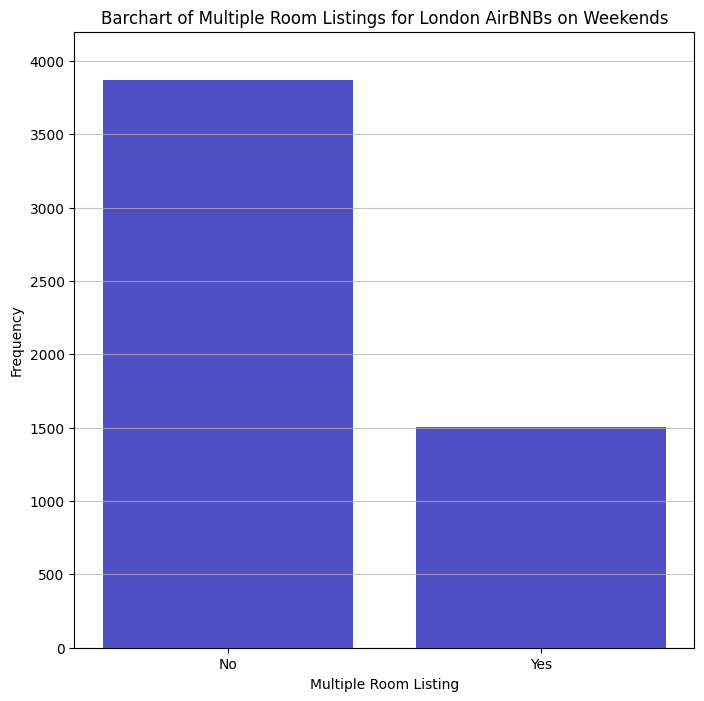

In [12]:
plt.bar(multi_values, multi_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Multiple Room Listing')
plt.ylabel('Frequency')
plt.title('Barchart of Multiple Room Listings for London AirBNBs on Weekends')
plt.xticks(ticks=[0, 1] ,labels=["No", "Yes"])

plt.ylim(ymax=4200)

In [13]:
biz_counts = london_weekends['biz'].value_counts()
biz_values = biz_counts.index.tolist()
biz_freqs = biz_counts.values.tolist()

biz_counts

biz
0    3454
1    1925
Name: count, dtype: int64

(0.0, 3700.0)

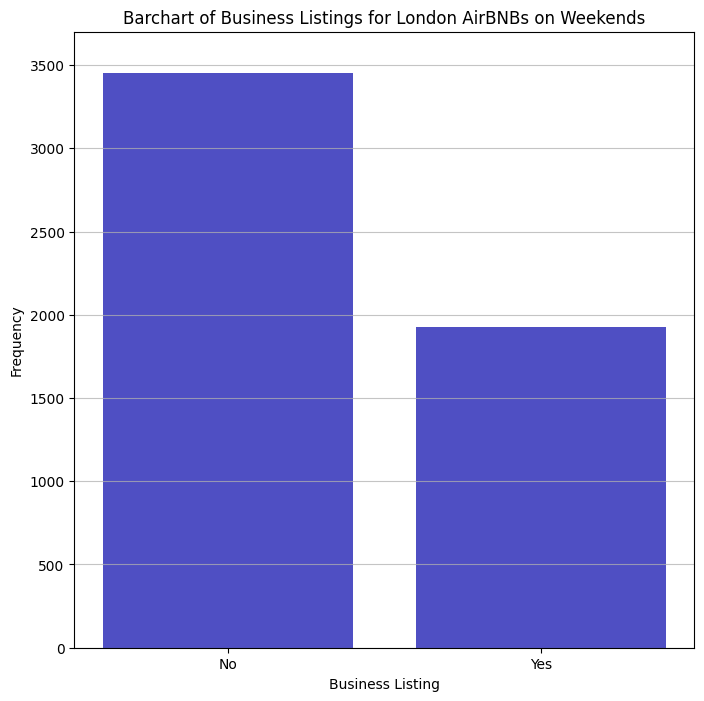

In [14]:
plt.bar(biz_values, biz_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Business Listing')
plt.ylabel('Frequency')
plt.title('Barchart of Business Listings for London AirBNBs on Weekends')
plt.xticks(ticks=[0, 1] ,labels=["No", "Yes"])

plt.ylim(ymax=3700)

In [15]:
capacity_counts = london_weekends['person_capacity'].value_counts()
capacity_values = capacity_counts.index.tolist()
capacity_freqs = capacity_counts.values.tolist()

capacity_counts

person_capacity
2.0    3316
4.0    1016
3.0     466
6.0     374
5.0     207
Name: count, dtype: int64

(0.0, 3500.0)

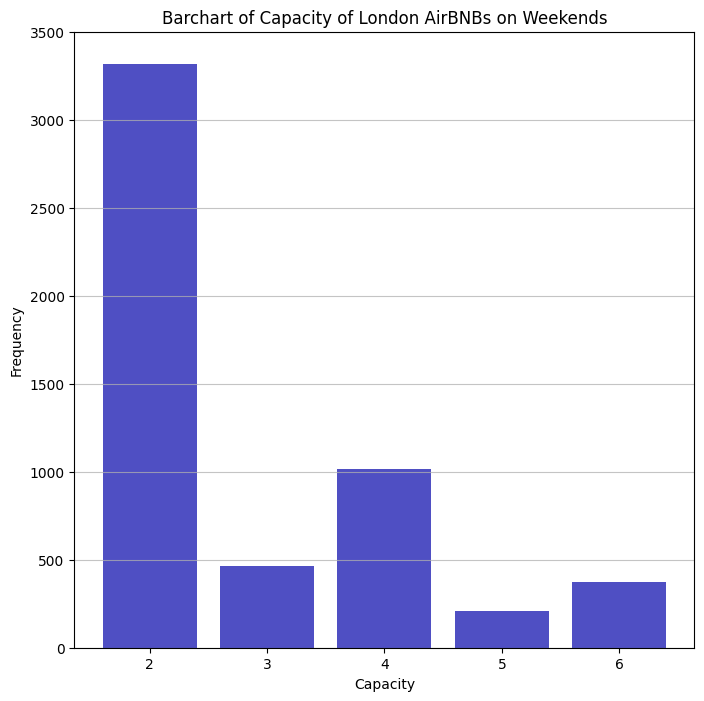

In [16]:
plt.bar(capacity_values, capacity_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Capacity')
plt.ylabel('Frequency')
plt.title('Barchart of Capacity of London AirBNBs on Weekends')

plt.ylim(ymax=3500)

In [17]:
cleanliness_counts = london_weekends['cleanliness_rating'].value_counts()
cleanliness_values = cleanliness_counts.index.tolist()
cleanliness_freqs = cleanliness_counts.values.tolist()

cleanliness_counts

cleanliness_rating
10.0    2741
9.0     1620
8.0      694
7.0      169
6.0       76
4.0       32
2.0       28
5.0       16
3.0        3
Name: count, dtype: int64

(0.0, 3000.0)

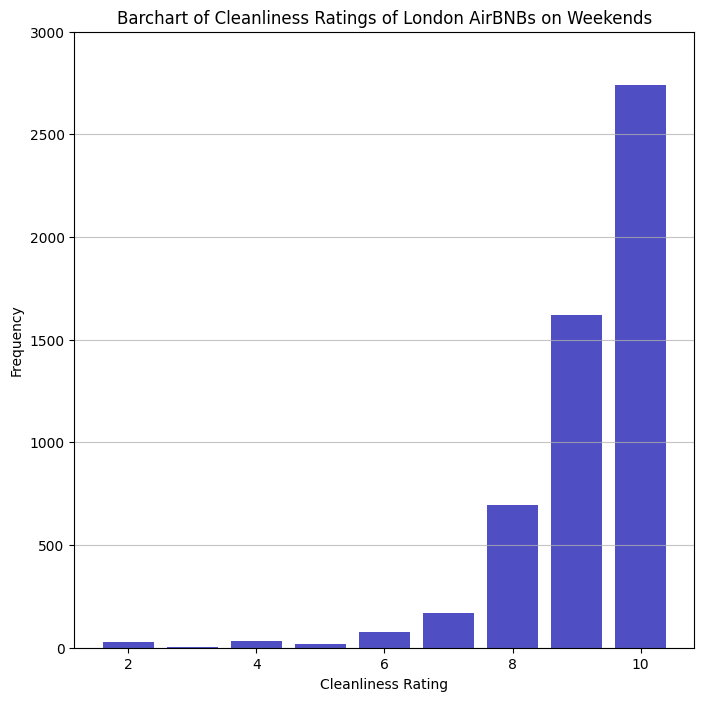

In [18]:
plt.bar(cleanliness_values, cleanliness_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Cleanliness Rating')
plt.ylabel('Frequency')
plt.title('Barchart of Cleanliness Ratings of London AirBNBs on Weekends')

plt.ylim(ymax=3000)

In [19]:
bedroom_counts = london_weekends['bedrooms'].value_counts()
bedroom_values = bedroom_counts.index.tolist()
bedroom_freqs = bedroom_counts.values.tolist()

bedroom_counts

bedrooms
1    4055
2     799
0     386
3     120
4      16
5       2
8       1
Name: count, dtype: int64

(0.0, 4200.0)

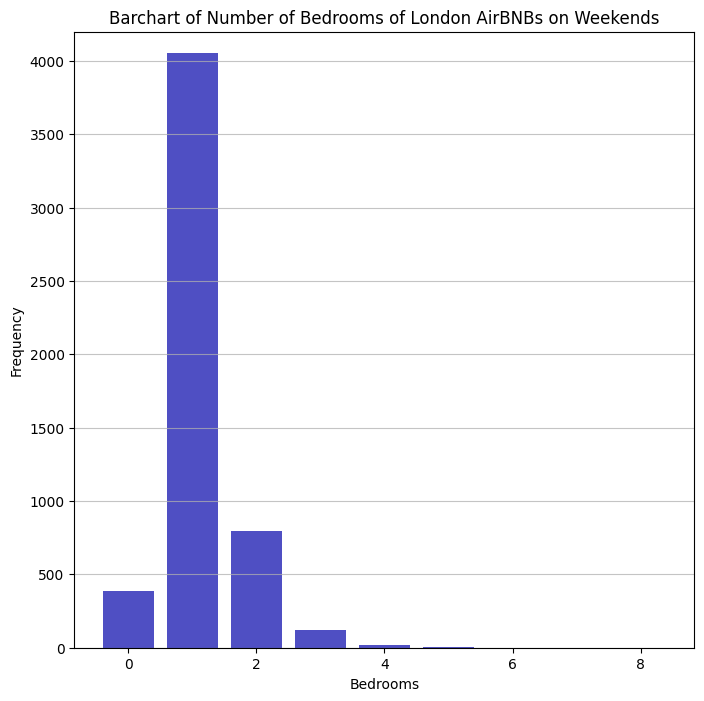

In [20]:
plt.bar(bedroom_values, bedroom_freqs, color='#0504aa', alpha=0.7, align='center')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Bedrooms')
plt.ylabel('Frequency')
plt.title('Barchart of Number of Bedrooms of London AirBNBs on Weekends')

plt.ylim(ymax=4200)

In [21]:
binned_guest_satisfaction = pd.cut(london_weekends['guest_satisfaction_overall'], 20)
binned_guest_satisfaction.value_counts()

guest_satisfaction_overall
(96.0, 100.0]    2091
(92.0, 96.0]     1009
(88.0, 92.0]      712
(84.0, 88.0]      483
(76.0, 80.0]      407
(80.0, 84.0]      282
(72.0, 76.0]      121
(56.0, 60.0]       85
(68.0, 72.0]       70
(64.0, 68.0]       33
(19.92, 24.0]      33
(36.0, 40.0]       29
(48.0, 52.0]        8
(60.0, 64.0]        8
(52.0, 56.0]        3
(28.0, 32.0]        3
(44.0, 48.0]        2
(24.0, 28.0]        0
(40.0, 44.0]        0
(32.0, 36.0]        0
Name: count, dtype: int64

(0.0, 2500.0)

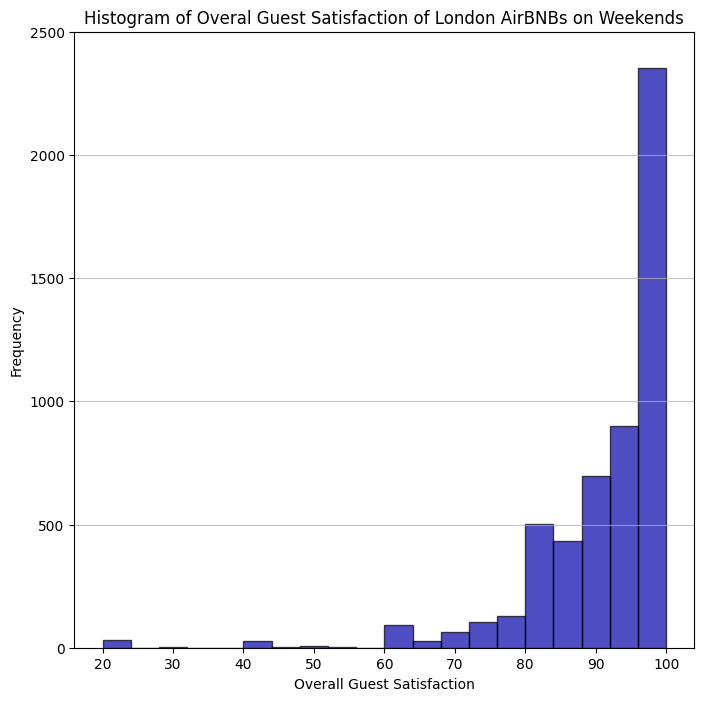

In [22]:
ax = london_weekends['guest_satisfaction_overall'].plot.hist(bins=20, color='#0504aa', alpha=0.7, 
                                                             edgecolor = "black")
ax.set_xlabel('Overall Guest Satisfaction')
plt.title('Histogram of Overal Guest Satisfaction of London AirBNBs on Weekends')
plt.grid(axis='y', alpha=0.75)
plt.ylim(ymax=2500)

In [23]:
binned_dist = pd.cut(london_weekends['dist'], 30)
binned_dist.value_counts()

dist
(4.073, 4.649]      571
(4.649, 5.225]      546
(3.497, 4.073]      528
(5.801, 6.377]      447
(5.225, 5.801]      408
(2.921, 3.497]      382
(6.953, 7.529]      298
(1.769, 2.345]      292
(2.345, 2.921]      291
(7.529, 8.105]      273
(6.377, 6.953]      271
(8.105, 8.681]      192
(1.193, 1.769]      187
(9.257, 9.833]      129
(8.681, 9.257]      106
(0.617, 1.193]      102
(9.833, 10.409]      83
(0.0233, 0.617]      58
(10.409, 10.985]     38
(13.865, 14.441]     34
(10.985, 11.561]     31
(14.441, 15.017]     29
(11.561, 12.137]     21
(13.289, 13.865]     14
(12.137, 12.713]     12
(15.017, 15.593]     12
(12.713, 13.289]      9
(16.745, 17.321]      7
(15.593, 16.169]      4
(16.169, 16.745]      4
Name: count, dtype: int64

(-2.0, 20.0)

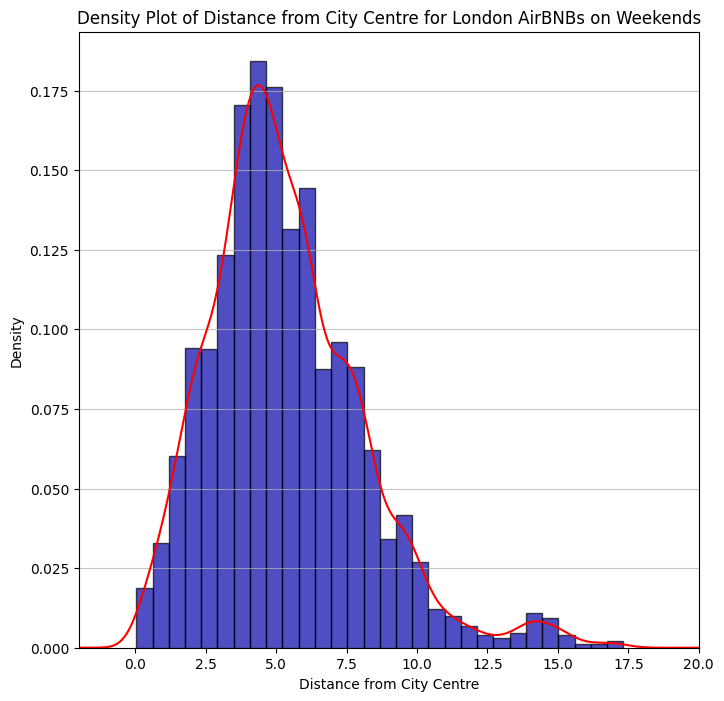

In [24]:
ax = london_weekends['dist'].plot.hist(bins=30, color='#0504aa', alpha=0.7, edgecolor = "black", density=True)
london_weekends['dist'].plot.density(ax = ax, color='red')
ax.set_xlabel('Distance from City Centre')
plt.title('Density Plot of Distance from City Centre for London AirBNBs on Weekends')
plt.grid(axis='y', alpha=0.75)
plt.xlim(xmax=20, xmin= -2)

The distance form city centre is very close to being normally distributed

In [25]:
binned_metro_dist = pd.cut(london_weekends['metro_dist'], 40)
binned_metro_dist.value_counts()

metro_dist
(0.243, 0.472]      1536
(0.472, 0.701]       947
(0.00471, 0.243]     818
(0.701, 0.93]        497
(0.93, 1.159]        312
(1.159, 1.388]       201
(1.388, 1.617]       141
(1.617, 1.846]       126
(2.075, 2.304]       114
(1.846, 2.075]       108
(2.533, 2.762]        74
(2.304, 2.533]        72
(2.991, 3.22]         35
(3.22, 3.449]         31
(4.823, 5.052]        30
(4.136, 4.365]        30
(4.365, 4.594]        30
(2.762, 2.991]        30
(3.907, 4.136]        26
(3.678, 3.907]        26
(3.449, 3.678]        23
(5.739, 5.968]        23
(5.052, 5.281]        22
(5.281, 5.51]         22
(4.594, 4.823]        21
(5.968, 6.197]        19
(5.51, 5.739]         18
(6.426, 6.655]        12
(6.197, 6.426]         9
(6.655, 6.884]         7
(7.342, 7.571]         5
(8.029, 8.258]         3
(7.113, 7.342]         2
(8.258, 8.487]         2
(8.716, 8.945]         2
(8.945, 9.174]         2
(6.884, 7.113]         1
(7.8, 8.029]           1
(8.487, 8.716]         1
(7.571, 7.8]  

(-0.5, 8.0)

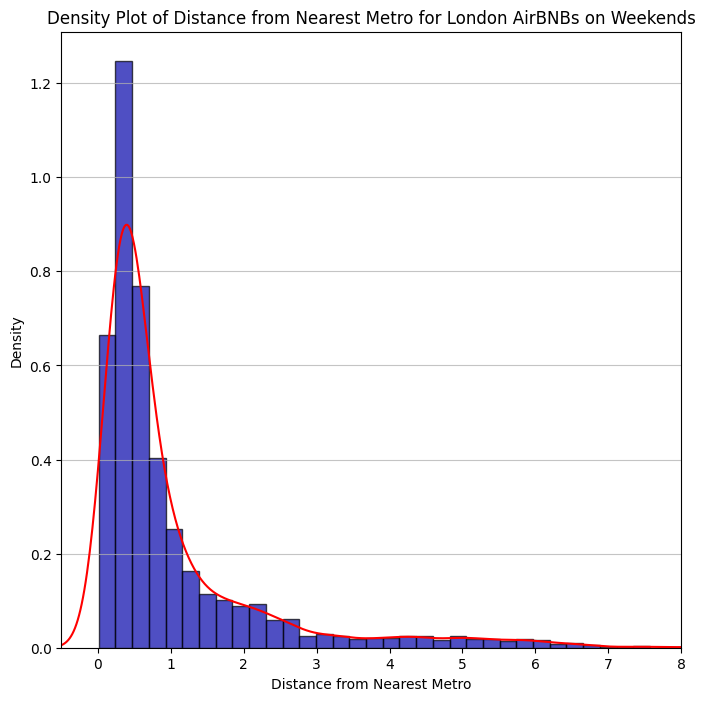

In [26]:
ax = london_weekends['metro_dist'].plot.hist(bins=40, color='#0504aa', alpha=0.7, edgecolor = "black", density=True)
london_weekends['metro_dist'].plot.density(ax = ax, color='red')
plt.title('Density Plot of Distance from Nearest Metro for London AirBNBs on Weekends')
ax.set_xlabel('Distance from Nearest Metro')
plt.grid(axis='y', alpha=0.75)
plt.xlim(xmax=8, xmin= -0.5)

The distance from the nearest metro is strongly right skewed

Text(0, 0.5, 'Sum')

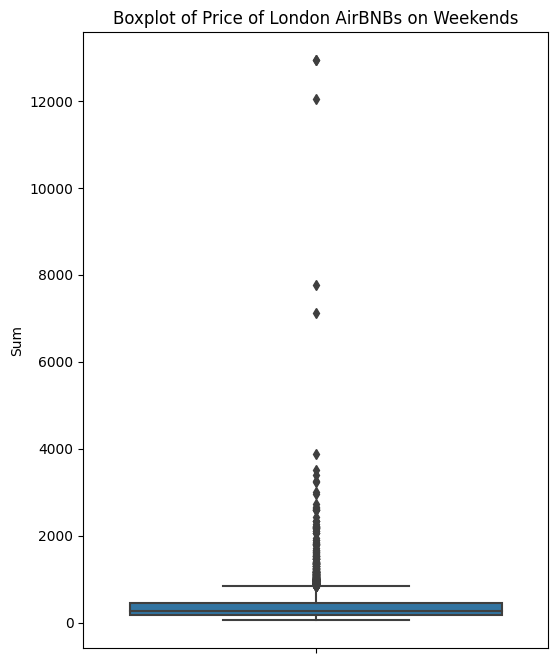

In [27]:
plt.rcParams['figure.figsize']=(6,8)
sns.boxplot(y=london_weekends["realSum"])
plt.title('Boxplot of Price of London AirBNBs on Weekends')
plt.ylabel('Sum')

As it can be seen, there are a few data points that are much further away from the rest. These attributes of these four data points (as well as the rest of the outliers) need to be observed before they can be completely ruled out as outliers

In [28]:
london_weekends[london_weekends["realSum"]> 4000].sort_values(by='realSum', ascending=False)

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
3550,12937.275101,Entire home/apt,0,0,6.0,0,0,0,10.0,100.0,2,2.938307,0.619716,-0.14658,51.53190
4559,12929.513864,Private room,0,1,2.0,0,0,0,7.0,80.0,1,5.623463,0.485578,-0.04987,51.49397
562,12048.731155,Private room,0,1,2.0,0,0,0,8.0,89.0,3,4.303580,0.709035,-0.18071,51.48849
4109,7759.354641,Entire home/apt,0,0,6.0,0,0,0,10.0,100.0,3,1.709108,0.296463,-0.13984,51.49503
5005,7115.642419,Entire home/apt,0,0,3.0,1,0,1,10.0,95.0,3,0.269093,0.227191,-0.13038,51.50995


None of these points, suggest anything too far out of the ordinary, they can be removed.

Text(0, 0.5, 'Sum')

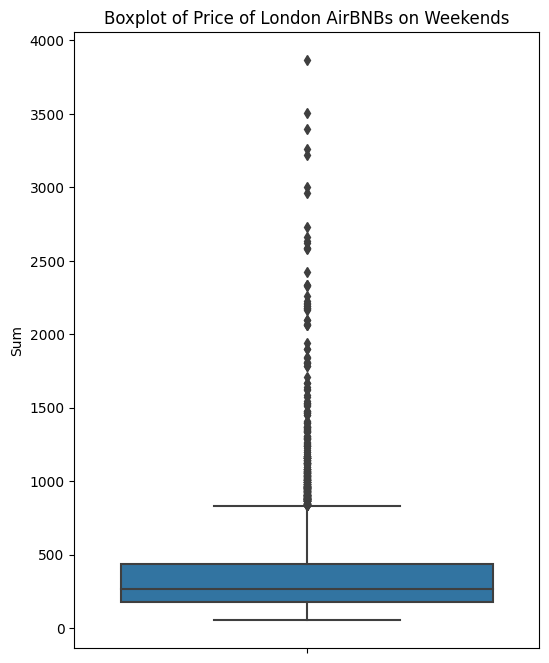

In [29]:
london_weekends = london_weekends[london_weekends['realSum'] < 4000]

sns.boxplot(y=london_weekends["realSum"])
plt.title('Boxplot of Price of London AirBNBs on Weekends')
plt.ylabel('Sum')

In [30]:
# finding bounds for the rest of the outliers

def find_bounds(df, column):
    '''
    return dictionary with lower bound, upper bound and median of data
    '''
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    med = np.median(df[column])
 
    iqr = q3-q1
 
    upper_bound = q3 + (1.5 * iqr)
    lower_bound = q1 - (1.5 * iqr)
    
    return {'lower': lower_bound, 'median': med, 'upper': upper_bound}

bounds = find_bounds(london_weekends, 'realSum')

print(bounds['upper'])

833.6273195512595


While the rest of the outliers will not be removed right away, it is important to know the upper bound in case I want to experiment with outliers being removed in the future

Cataloguing the AirBnBs with highly desirable attributes, mainly out of curiousity of the price range and number of properties with these values

In [31]:
london_weekends.query('dist < 4.0 and metro_dist < 0.243 and guest_satisfaction_overall > 95.9 and cleanliness_rating > 9.0 and bedrooms > 1 and person_capacity > 2.0').sort_values(by='realSum', ascending=False)

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
5008,2587.549096,Private room,0,1,3.0,1,0,1,10.0,99.0,2,0.367443,0.129183,-0.13217,51.50989
1247,2421.270491,Entire home/apt,0,0,6.0,0,0,1,10.0,100.0,3,0.383092,0.218441,-0.12412,51.51104
4469,1543.780428,Entire home/apt,0,0,6.0,1,0,1,10.0,97.0,2,0.632574,0.217999,-0.12700,51.51400
4765,1464.756932,Entire home/apt,0,0,6.0,1,0,1,10.0,99.0,2,0.632559,0.217972,-0.12700,51.51400
4756,1464.756932,Entire home/apt,0,0,6.0,1,1,0,10.0,98.0,2,0.632577,0.218005,-0.12700,51.51400
2085,1348.103201,Entire home/apt,0,0,6.0,0,0,1,10.0,100.0,2,0.421252,0.129777,-0.12653,51.51206
3633,1229.097580,Entire home/apt,0,0,6.0,1,0,1,10.0,97.0,4,2.733308,0.199870,-0.15837,51.52358
3350,1122.556975,Entire home/apt,0,0,6.0,1,0,1,10.0,99.0,2,2.389016,0.175745,-0.12183,51.52950
3459,1098.567699,Entire home/apt,0,0,6.0,1,1,0,10.0,98.0,2,0.762994,0.227766,-0.12500,51.51500
1433,1015.310802,Entire home/apt,0,0,5.0,1,1,0,10.0,97.0,2,0.938774,0.197181,-0.12820,51.51675


As can be observed, most of the AirBnBs with multiple desirable qualities are deemed to be 'outliers'. Therefore, they should be included in the modelling process

In [32]:
print(london_weekends['lng'].min(), london_weekends['lng'].max(), 
      london_weekends['lat'].min(), london_weekends['lat'].max())

-0.2517 0.12018 51.4144 51.57582


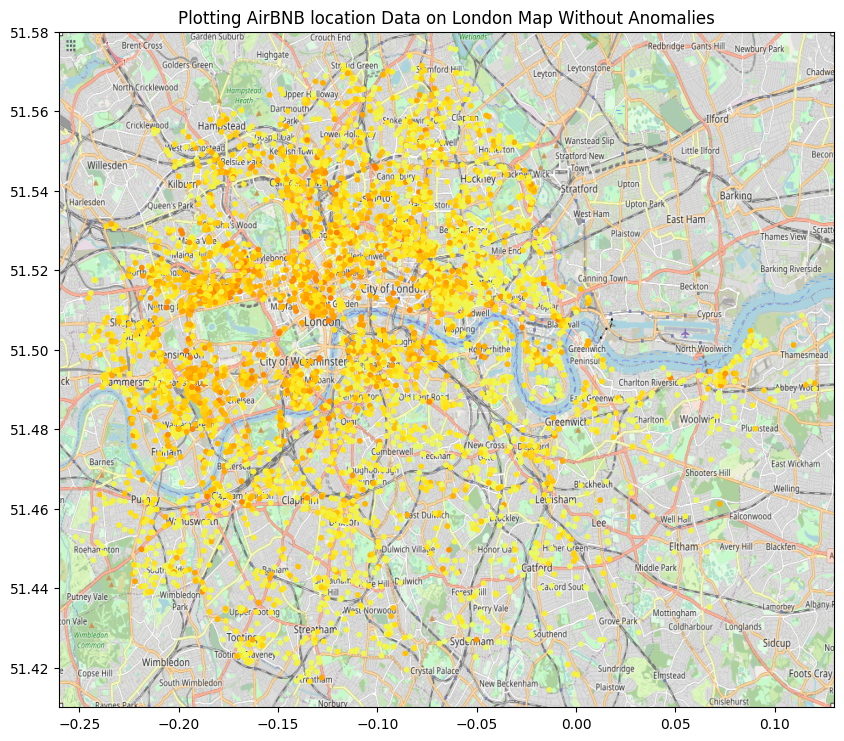

In [33]:
london_BBox = [-0.26, 0.13, 51.41, 51.58]

# map obtained from OpenStreetMap

london_weekend_bg = plt.imread('ksnip_20230520-211513.png')

london_weekend_non_outliers = london_weekends[london_weekends['realSum'] < 834]
london_weekend_outliers = london_weekends[london_weekends['realSum'] >= 834]

fig, ax = plt.subplots(figsize = (10,10))

ax.scatter(london_weekend_non_outliers.lng, london_weekend_non_outliers.lat, zorder=1, alpha=1, 
           c=london_weekend_non_outliers['realSum'], cmap='Wistia', s=10)
ax.set_title('Plotting AirBNB location Data on London Map Without Anomalies')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

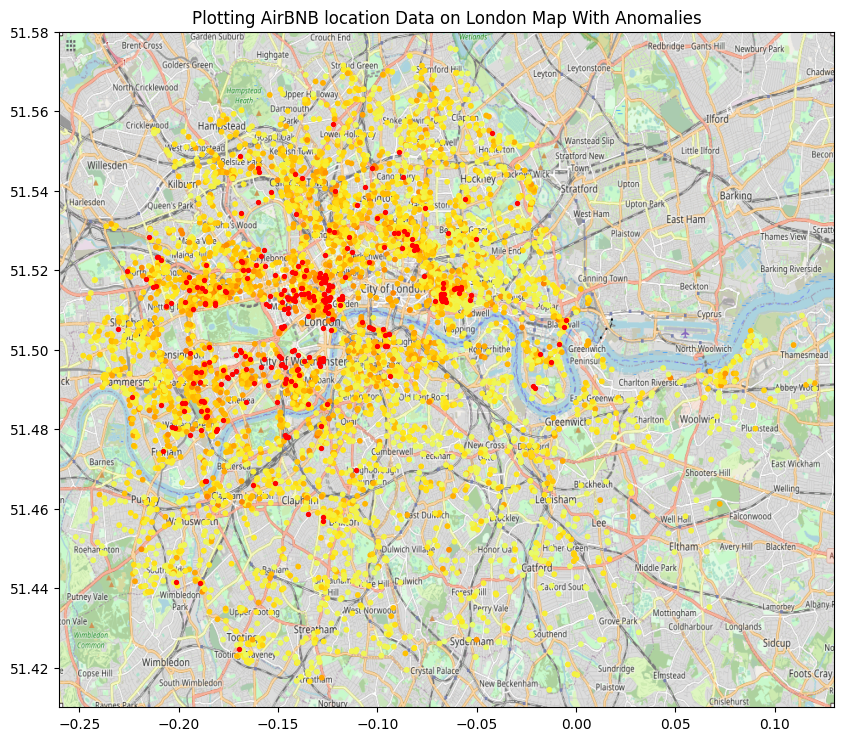

In [34]:
fig, ax = plt.subplots(figsize = (10,10))

ax.scatter(london_weekend_non_outliers.lng, london_weekend_non_outliers.lat, zorder=1, alpha=1, 
           c=london_weekend_non_outliers['realSum'], cmap='Wistia', s=10)
ax.scatter(london_weekend_outliers.lng, london_weekend_outliers.lat, zorder=1, c='red', s=8)

# the above was used to spot if very expensive airbnbs had any particular distribution
ax.set_title('Plotting AirBNB location Data on London Map With Anomalies')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

The most expensive and anomalous AirBnBs are fairly centrally located, one again warranting their inclusion in the dataset for modelling purposes

# Feature Engineering

While there was an initial idea to use a clustering algorithm to give the idea of neighbourhoods, this is unnecessary as London has officially designated boroughs. Furthermore, just by observing the data, no clear cluster patterns are evident.

## Marking points by Boroughs

In [35]:
# Borough boundary data obtained from https://www.openintro.org/data/index.php?data=london_boroughs

# Coordinates from this dataset are do not use Latitude and Longitude but Eastings And Northings (National Grid System)

london_boroughs = pd.read_csv("london_boroughs.csv")

london_boroughs[london_boroughs['borough'] == "Barnet"].head()

,borough,x,y
1355,Barnet,NaN,NaN
1356,Barnet,524579.9,198355.2
1357,Barnet,524594.3,198321.4
1358,Barnet,524607.4,198266.8
1359,Barnet,524619.1,198227.4


In [36]:
london_boroughs.dropna(inplace=True, ignore_index=True)

london_boroughs[london_boroughs['borough'] == "Barnet"].head()

,borough,x,y
1355,Barnet,524579.9,198355.2
1356,Barnet,524594.3,198321.4
1357,Barnet,524607.4,198266.8
1358,Barnet,524619.1,198227.4
1359,Barnet,524630.0,198197.0


In [37]:
# convert coordinates

london_boroughs['lng'] = np.nan
london_boroughs['lat'] = np.nan
latlon = london_boroughs.apply(lambda x: OSGB36toWGS84(x['x'], x['y']), axis = 1)
london_boroughs[['lat', 'lng']] = pd.DataFrame(latlon.tolist(), index=latlon.index)

london_boroughs.head() 

,borough,x,y,lng,lat
0,Barking & Dagenham,543522.5,184862.5,0.068327,51.544414
1,Barking & Dagenham,543577.6,184846.7,0.069115,51.544258
2,Barking & Dagenham,543577.1,184837.7,0.069104,51.544177
3,Barking & Dagenham,543595.5,184832.8,0.069367,51.544128
4,Barking & Dagenham,543601.7,184831.2,0.069456,51.544113


In [38]:
# Creating a dataframe of polygon objects created from borough boundary data

borough_list = london_boroughs['borough'].unique().tolist()
borough_polygons = pd.DataFrame()
borough_polygons['borough'] = np.nan
borough_polygons['polygon'] = np.nan
for borough in borough_list:
    poly_coords = london_boroughs[london_boroughs['borough'] == borough][['lng', 'lat']].values.tolist()
    poly = Polygon(poly_coords)
    new_row = {'borough': borough, 'polygon': poly}
    borough_polygons.loc[len(borough_polygons)] = new_row

borough_polygons.head()

,borough,polygon
0,Barking & Dagenham,"POLYGON ((0.068327 51.544414, 0.069115 51.5442..."
1,Barnet,"POLYGON ((-0.199896 51.670167, -0.1997 51.6698..."
2,Bexley,"POLYGON ((0.155849 51.430876, 0.15561 51.43043..."
3,Brent,"POLYGON ((-0.196569 51.527654, -0.196847 51.52..."
4,Bromley,"POLYGON ((0.012131 51.299599, 0.011962 51.2997..."


Need to use GeoDataFrame to do Point in Polygon joins

In [39]:
borough_polygons_gpd = gpd.GeoDataFrame(borough_polygons, geometry='polygon')

borough_polygons_gpd.head()

,borough,polygon
0,Barking & Dagenham,"POLYGON ((0.06833 51.54441, 0.06911 51.54426, ..."
1,Barnet,"POLYGON ((-0.19990 51.67017, -0.19970 51.66986..."
2,Bexley,"POLYGON ((0.15585 51.43088, 0.15561 51.43044, ..."
3,Brent,"POLYGON ((-0.19657 51.52765, -0.19685 51.52773..."
4,Bromley,"POLYGON ((0.01213 51.29960, 0.01196 51.29980, ..."


In [40]:
london_weekends['coords'] = list(zip(london_weekends['lng'], london_weekends['lat']))
london_weekends['coords'] = london_weekends['coords'].apply(Point)
london_weekends_geo = gpd.GeoDataFrame(london_weekends, geometry='coords')

london_weekends_geo.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat,coords
0,121.122322,Private room,0,1,2.0,0,0,0,6.0,69.0,1,5.734117,0.437094,-0.04975,51.52570,POINT (-0.04975 51.52570)
1,195.912416,Private room,0,1,2.0,0,1,0,10.0,96.0,1,4.788905,1.464050,-0.08475,51.54210,POINT (-0.08475 51.54210)
2,193.325337,Private room,0,1,3.0,0,1,0,10.0,95.0,1,4.596677,0.450306,-0.14585,51.54802,POINT (-0.14585 51.54802)
3,180.389943,Private room,0,1,2.0,0,1,0,9.0,87.0,1,2.054769,0.132670,-0.10611,51.52108,POINT (-0.10611 51.52108)
4,405.700981,Entire home/apt,0,0,3.0,0,0,1,7.0,65.0,0,4.491277,0.354108,-0.18797,51.49399,POINT (-0.18797 51.49399)


In [41]:
london_weekends_geo_counties = gpd.tools.sjoin(london_weekends_geo, borough_polygons_gpd, 
                                               predicate="within", how='left')

london_weekends_geo_counties.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat,coords,index_right,borough
0,121.122322,Private room,0,1,2.0,0,0,0,6.0,69.0,1,5.734117,0.437094,-0.04975,51.52570,POINT (-0.04975 51.52570),28.0,Tower Hamlets
1,195.912416,Private room,0,1,2.0,0,1,0,10.0,96.0,1,4.788905,1.464050,-0.08475,51.54210,POINT (-0.08475 51.54210),10.0,Hackney
2,193.325337,Private room,0,1,3.0,0,1,0,10.0,95.0,1,4.596677,0.450306,-0.14585,51.54802,POINT (-0.14585 51.54802),5.0,Camden
3,180.389943,Private room,0,1,2.0,0,1,0,9.0,87.0,1,2.054769,0.132670,-0.10611,51.52108,POINT (-0.10611 51.52108),17.0,Islington
4,405.700981,Entire home/apt,0,0,3.0,0,0,1,7.0,65.0,0,4.491277,0.354108,-0.18797,51.49399,POINT (-0.18797 51.49399),18.0,Kensington & Chelsea


In [42]:
print(london_weekends_geo_counties['borough'].unique().tolist())

['Tower Hamlets', 'Hackney', 'Camden', 'Islington', 'Kensington & Chelsea', 'Greenwich', 'Wandsworth', 'Lambeth', 'Southwark', 'Lewisham', 'Westminster', nan, 'Hammersmith & Fulham', 'Brent']


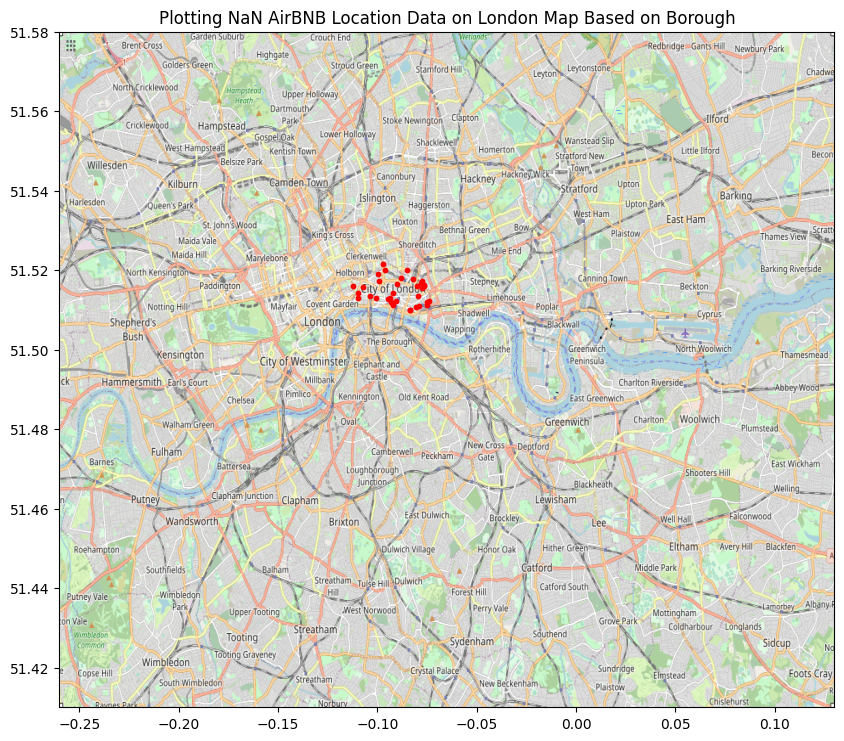

In [43]:
fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(london_weekends_geo_counties[london_weekends_geo_counties['borough'].isnull()].lng, 
           london_weekends_geo_counties[london_weekends_geo_counties['borough'].isnull()].lat, 
           zorder=1, alpha=1, c='red', s=10)
ax.set_title('Plotting NaN AirBNB Location Data on London Map Based on Borough')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

All the null points are in the City of London, which is not a borough

In [44]:
london_weekends_geo_counties['borough'] = london_weekends_geo_counties['borough'].fillna('City')
london_weekends_geo_counties.drop(['index_right', 'coords'], axis=1, inplace=True)

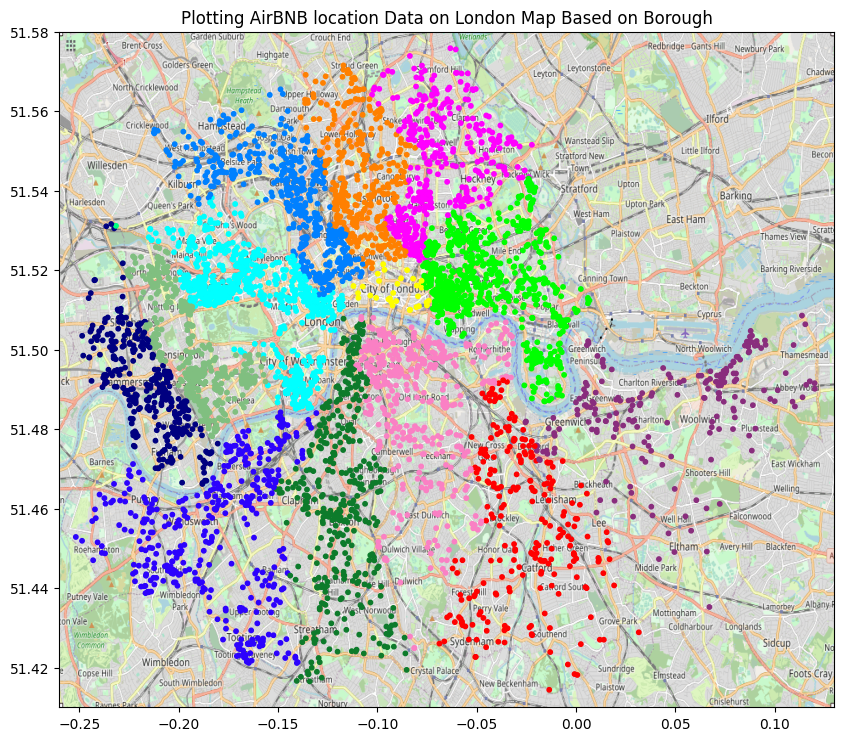

In [45]:
airbnb_boroughs = london_weekends_geo_counties['borough'].unique().tolist()
colors = distinctipy.get_colors(len(airbnb_boroughs))

borough_colors = {}

for i, borough_name in enumerate(airbnb_boroughs):
    borough_colors[borough_name] = colors[i] 

fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(london_weekends_geo_counties.lng, london_weekends_geo_counties.lat, zorder=1, alpha=1, 
           c=[borough_colors[color] for color in london_weekends_geo_counties['borough']], s=10)
ax.set_title('Plotting AirBNB location Data on London Map Based on Borough')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

In [46]:
london_weekends_geo_counties['borough'].value_counts()

borough
Tower Hamlets           831
Westminster             763
Camden                  500
Kensington & Chelsea    457
Southwark               419
Lambeth                 415
Hackney                 410
Wandsworth              408
Islington               359
Hammersmith & Fulham    338
Lewisham                236
Greenwich               203
City                     34
Brent                     1
Name: count, dtype: int64

## Proximity to Attractions and Busy Metros

Other features that could be added include proximity to nearest attractions, or the nearest busy metro station (not just any metro) to gauge the connectedness of AirBnBs

### Calculating Distance to Popular London Attractions

In [47]:
# 10 most visited tourist attractions in London from https://www.statista.com/statistics/630146/leading-london-visitor-attractions-uk/

# I would have used BeautifulSoup to scrape the names, but for some reason this data is paywalled unless the link is clicked from a Google Search

london_attractions = ['Natural History Museum (South Kensington)', 'British Museum', 'Tate Modern', 
                      'Southbank Centre', 'The National Gallery', 'Victoria and Albert Museum (South Kensington)', 
                      'Somerset House', 'Science Museum', 'Tower of London', 'Royal Botanic Gardens, Kew', 
                      'Royal Museums Greenwich', 'Royal Albert Hall', "St Paul's Cathedral", 'British Library', 
                      'Westminster Abbey', 'ZSL London Zoo', 'Tate Britain', 'Horniman Museum and Gardens', 
                      'The Royal Opera House Covent Garden', 'Royal Academy of Arts']

visitors = [4655, 4097, 3883, 2947, 2727, 2370, 2347, 2335, 2020, 
            1964, 1629, 1449, 1194, 1149, 1063, 1045, 913, 790, 697, 696]

#coordinates found using Google's Geocode API

lng = []
lat = []

for attraction in london_attractions:
    attraction_string = (attraction + " London").replace("(", "").replace(")", "").replace(" ", "%20")
    attraction_url = "https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}".format(attraction_string, 
                                                                                                  config.google_maps_api_key)
    geocode_response = requests.get(attraction_url)
    geocode_json = json.loads(geocode_response.content)
    lng.append(geocode_json['results'][0]['geometry']['location']['lng'])
    lat.append(geocode_json['results'][0]['geometry']['location']['lat'])


header = ['attraction', 'lat', 'lng', 'visitors in thousands']
attraction_df = pd.DataFrame(list(zip(london_attractions, lat, lng, visitors)), columns=header)

attraction_df

,attraction,lat,lng,visitors in thousands
0,Natural History Museum (South Kensington),51.496715,-0.176367,4655
1,British Museum,51.519413,-0.126957,4097
2,Tate Modern,51.507595,-0.099356,3883
3,Southbank Centre,51.506081,-0.116304,2947
4,The National Gallery,51.508929,-0.128299,2727
5,Victoria and Albert Museum (South Kensington),51.495750,-0.172380,2370
6,Somerset House,51.511059,-0.117148,2347
7,Science Museum,51.497222,-0.176728,2335
8,Tower of London,51.508112,-0.075949,2020
9,"Royal Botanic Gardens, Kew",51.483711,-0.289687,1964


In [48]:
# Since there were only 20 locations, I checked every one of them as Google's GeoCode API has some inconsistencies

# The Tate Modern coordinates were very far off and therefore had to be manually changed

# Google GeoCode API consistently has an error even though searching Tate Modern in Google Maps always gives the correct result

attraction_df.loc[attraction_df['attraction'] == 'Tate Modern', ["lat", "lng"]] = [51.507748, -0.099345]

attraction_df.head()

,attraction,lat,lng,visitors in thousands
0,Natural History Museum (South Kensington),51.496715,-0.176367,4655
1,British Museum,51.519413,-0.126957,4097
2,Tate Modern,51.507748,-0.099345,3883
3,Southbank Centre,51.506081,-0.116304,2947
4,The National Gallery,51.508929,-0.128299,2727


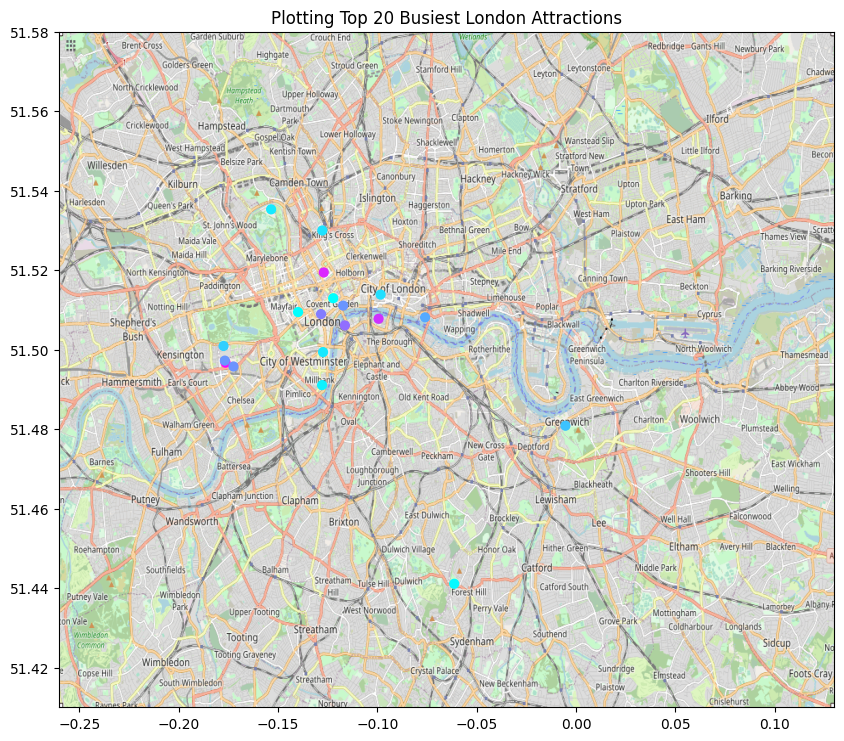

In [49]:
fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(attraction_df.lng, attraction_df.lat, zorder=1, alpha=1, c=attraction_df['visitors in thousands'], 
           cmap='cool', s=40)
ax.set_title('Plotting Top 20 Busiest London Attractions')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

Most of the top visited attractions in London are central. However, there are a few that are not so central and could provide more information regarding house prices in the area. Furthermore, the attractions closer to the centre could also provide information about the differences in price for AirBnBs in Central London. The model XGBoost, which is a model that will be used to predict the prices is also robust to extra information, unlike say a neural network. Therefore, the distance to the nearest attraction will still be included as a column in the data to be modelled.

In [50]:
# For personal reference:

# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html
# https://stackoverflow.com/questions/16476924/how-to-iterate-over-rows-in-a-dataframe-in-pandas

# The below was particularly useful for this application

# https://stackoverflow.com/questions/74819924/python-haversine-distance-between-2-dataframes-and-allocate-the-corresponding

from sklearn.metrics import DistanceMetric

distance = DistanceMetric.get_metric('haversine')

lat1 = london_weekends_geo_counties.loc[:, 'lat']
lng1 = london_weekends_geo_counties.loc[:, 'lng']
lat2 = attraction_df.loc[:, 'lat']
lng2 = attraction_df.loc[:, 'lng']

min_attraction_dists = 6371 * (distance.pairwise((np.array([lat1, lng1]) * np.pi / 180).T, 
                                                 (np.array([lat2, lng2]) * np.pi / 180).T)).min(axis=1)

london_weekends_geo_counties['dist_to_nearest_popular_attraction'] = min_attraction_dists

london_weekends_geo_counties.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat,borough,dist_to_nearest_popular_attraction
0,121.122322,Private room,0,1,2.0,0,0,0,6.0,69.0,1,5.734117,0.437094,-0.04975,51.52570,Tower Hamlets,2.666649
1,195.912416,Private room,0,1,2.0,0,1,0,10.0,96.0,1,4.788905,1.464050,-0.08475,51.54210,Hackney,3.260936
2,193.325337,Private room,0,1,3.0,0,1,0,10.0,95.0,1,4.596677,0.450306,-0.14585,51.54802,Camden,1.509728
3,180.389943,Private room,0,1,2.0,0,1,0,9.0,87.0,1,2.054769,0.132670,-0.10611,51.52108,Islington,0.967173
4,405.700981,Entire home/apt,0,0,3.0,0,0,1,7.0,65.0,0,4.491277,0.354108,-0.18797,51.49399,Kensington & Chelsea,0.857185


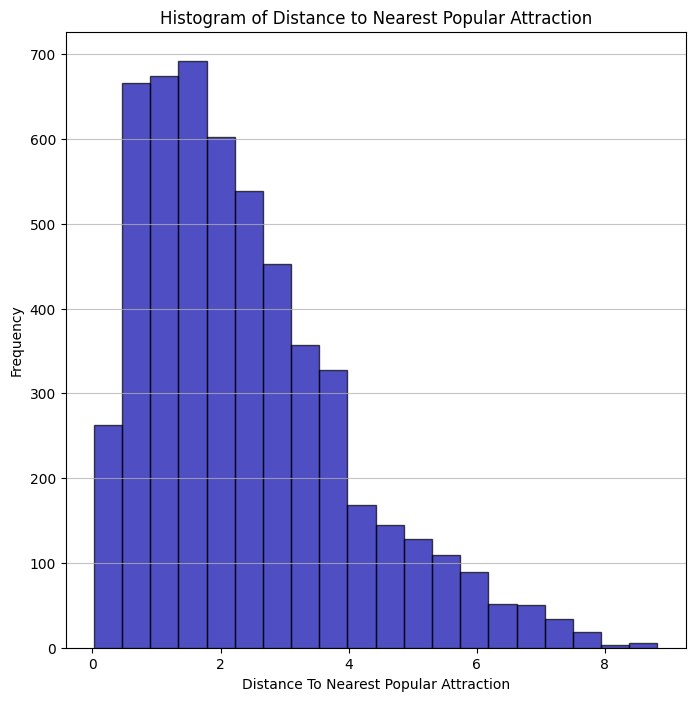

In [51]:
plt.rcParams['figure.figsize'] = (8, 8)
ax = london_weekends_geo_counties['dist_to_nearest_popular_attraction'].plot.hist(bins=20, color='#0504aa', 
                                                                                  alpha=0.7, edgecolor='black')
ax.set_xlabel("Distance To Nearest Popular Attraction")
plt.title("Histogram of Distance to Nearest Popular Attraction")
plt.grid(alpha=0.75, axis='y')

### Calculating Distance to Popular London Stations

In [52]:
london_train_station_wiki_url = 'https://en.wikipedia.org/wiki/List_of_busiest_railway_stations_in_Great_Britain'

# Fetch the HTML content
response = requests.get(london_train_station_wiki_url)

# Parse the HTML content
soup = BeautifulSoup(response.content, 'html.parser')

# Find the table on the page
table = soup.find('table', class_='wikitable')

# Extract table rows
london_stations = []
london_station_traffic = []
i = 0
for row in table.find_all('tr'):
    if i == 0:
        i += 1
        continue
    row_data = [td.text.strip() for td in row.find_all('td')]
    if row_data[4] == 'London':
        london_stations.append(row_data[1])
        london_station_traffic.append(float(row_data[2]))

print(london_stations)
print(london_station_traffic)

['London Waterloo', 'London Victoria', 'London Bridge', 'London Liverpool Street', 'Stratford', 'London Paddington', 'London Euston', "London King's Cross", 'London St Pancras International', 'Highbury & Islington', 'Clapham Junction', 'London Charing Cross', 'East Croydon', 'Canada Water', 'Vauxhall', 'Barking', 'Wimbledon', 'Whitechapel', 'London Fenchurch Street', 'London Marylebone', 'West Ham', 'London Cannon Street', 'Farringdon', 'Richmond', 'Romford', 'Tottenham Hale', 'Blackfriars', 'Seven Sisters', 'Willesden Junction', 'Lewisham', 'Waterloo East', "Shepherd's Bush", 'Surbiton', 'Shoreditch High Street', 'Ealing Broadway', 'Ilford', 'Finsbury Park', 'Bromley South']
[41.426, 36.776, 33.309, 32.165, 28.182, 23.87, 23.097, 20.476, 18.995, 17.816, 17.397, 15.733, 14.504, 13.645, 11.651, 11.232, 9.952, 9.273, 7.795, 7.488, 7.45, 7.023, 6.865, 6.423, 6.287, 6.096, 5.982, 5.4, 5.357, 5.248, 5.109, 5.009, 4.987, 4.843, 4.768, 4.754, 4.599, 4.6]


In [53]:
lng = []
lat = []

for station in london_stations:
    station_string = (station + " Station").replace("&", "").replace(" ", "%20")
    station_url = "https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}".format(station_string, 
                                                                                               config.google_maps_api_key)
    geocode_response = requests.get(station_url)
    geocode_json = json.loads(geocode_response.content)
    lng.append(geocode_json['results'][0]['geometry']['location']['lng'])
    lat.append(geocode_json['results'][0]['geometry']['location']['lat'])


header = ['station', 'lat', 'lng', 'entries/exits in millions']
station_df = pd.DataFrame(list(zip(london_stations, lat, lng, london_station_traffic)), columns=header)

station_df

,station,lat,lng,entries/exits in millions
0,London Waterloo,51.503165,-0.112305,41.426
1,London Victoria,51.495210,-0.143898,36.776
2,London Bridge,51.504263,-0.084802,33.309
3,London Liverpool Street,51.518752,-0.081437,32.165
4,Stratford,51.541533,-0.002801,28.182
5,London Paddington,51.516674,-0.176933,23.870
6,London Euston,51.528099,-0.133208,23.097
7,London King's Cross,51.531603,-0.123598,20.476
8,London St Pancras International,51.531427,-0.126133,18.995
9,Highbury & Islington,51.546477,-0.104312,17.816


In [54]:
# Richmond Station coordinates were obviously wrong, the coordinates of a Richmond Station in Canada was accessed instead

station_df.loc[station_df['station'] == 'Richmond', ["lat", "lng"]] = [51.463406, -0.301789]

station_df[station_df['station'] == 'Richmond']

,station,lat,lng,entries/exits in millions
23,Richmond,51.463406,-0.301789,6.423


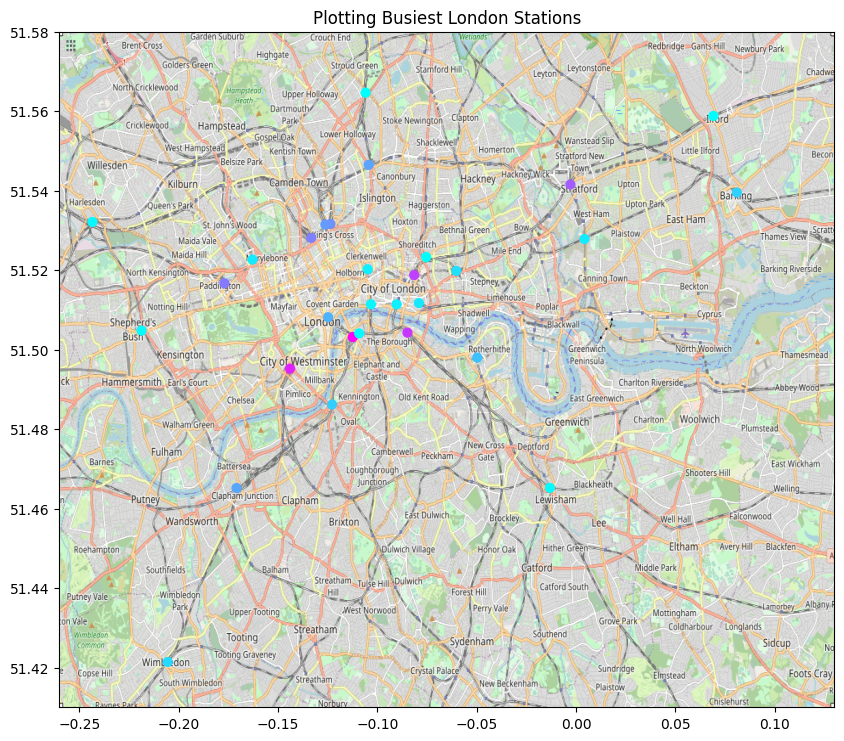

In [55]:
fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(station_df.lng, station_df.lat, zorder=1, alpha=1, c=station_df['entries/exits in millions'], 
           cmap='cool', s=40)
ax.set_title('Plotting Busiest London Stations')
ax.set_xlim(london_BBox[0],london_BBox[1])
ax.set_ylim(london_BBox[2],london_BBox[3])
ax.imshow(london_weekend_bg, zorder=0, extent = london_BBox, aspect= 2)

Some of the busy stations are slightly further away from Central London, potentially giving an idea of what the 'hubs' of certain areas are. The distance of AirBnBs from these stations might be more informative than simply the distance to the nearest station, due to both the much heavier right-skewedness of the 'metro_dist' distribution and the additional information of the accessibility of AirBnBs to these 'hubs' that the new data provides.

In [56]:
lat1 = london_weekends_geo_counties.loc[:, 'lat']
lng1 = london_weekends_geo_counties.loc[:, 'lng']
lat2 = station_df.loc[:, 'lat']
lng2 = station_df.loc[:, 'lng']

min_station_dists = 6371 * (distance.pairwise((np.array([lat1, lng1]) * np.pi / 180).T, 
                                              (np.array([lat2, lng2]) * np.pi / 180).T)).min(axis=1)

london_weekends_geo_counties['dist_to_nearest_popular_station'] = min_station_dists

london_weekends_geo_counties.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat,borough,dist_to_nearest_popular_attraction,dist_to_nearest_popular_station
0,121.122322,Private room,0,1,2.0,0,0,0,6.0,69.0,1,5.734117,0.437094,-0.04975,51.52570,Tower Hamlets,2.666649,0.977156
1,195.912416,Private room,0,1,2.0,0,1,0,10.0,96.0,1,4.788905,1.464050,-0.08475,51.54210,Hackney,3.260936,1.437636
2,193.325337,Private room,0,1,3.0,0,1,0,10.0,95.0,1,4.596677,0.450306,-0.14585,51.54802,Camden,1.509728,2.294281
3,180.389943,Private room,0,1,2.0,0,1,0,9.0,87.0,1,2.054769,0.132670,-0.10611,51.52108,Islington,0.967173,0.131928
4,405.700981,Entire home/apt,0,0,3.0,0,0,1,7.0,65.0,0,4.491277,0.354108,-0.18797,51.49399,Kensington & Chelsea,0.857185,2.438521


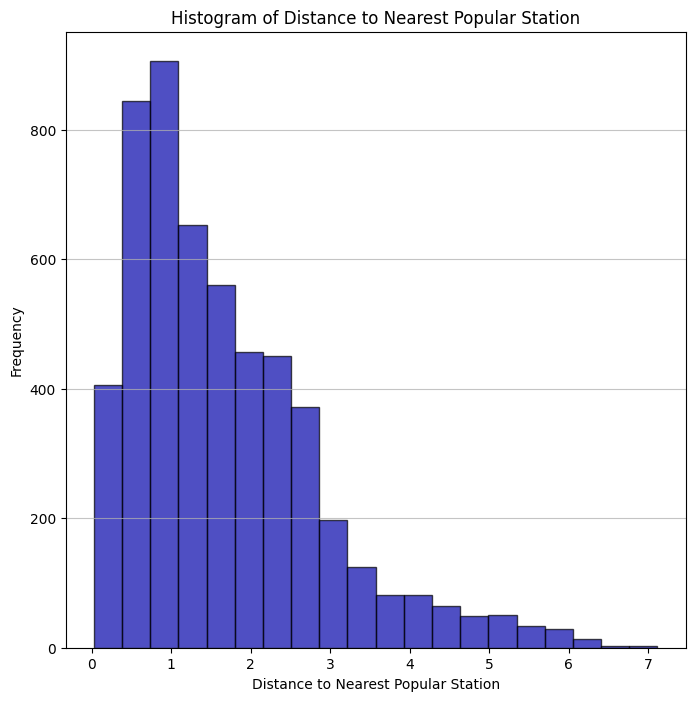

In [57]:
plt.rcParams['figure.figsize'] = (8,8)
ax = london_weekends_geo_counties['dist_to_nearest_popular_station'].plot.hist(bins=20, color='#0504aa', 
                                                                               alpha=0.7, edgecolor = 'black')
ax.set_xlabel("Distance to Nearest Popular Station")
plt.title("Histogram of Distance to Nearest Popular Station")
plt.grid(axis='y', alpha=0.75)

# Correlations

<Axes: >

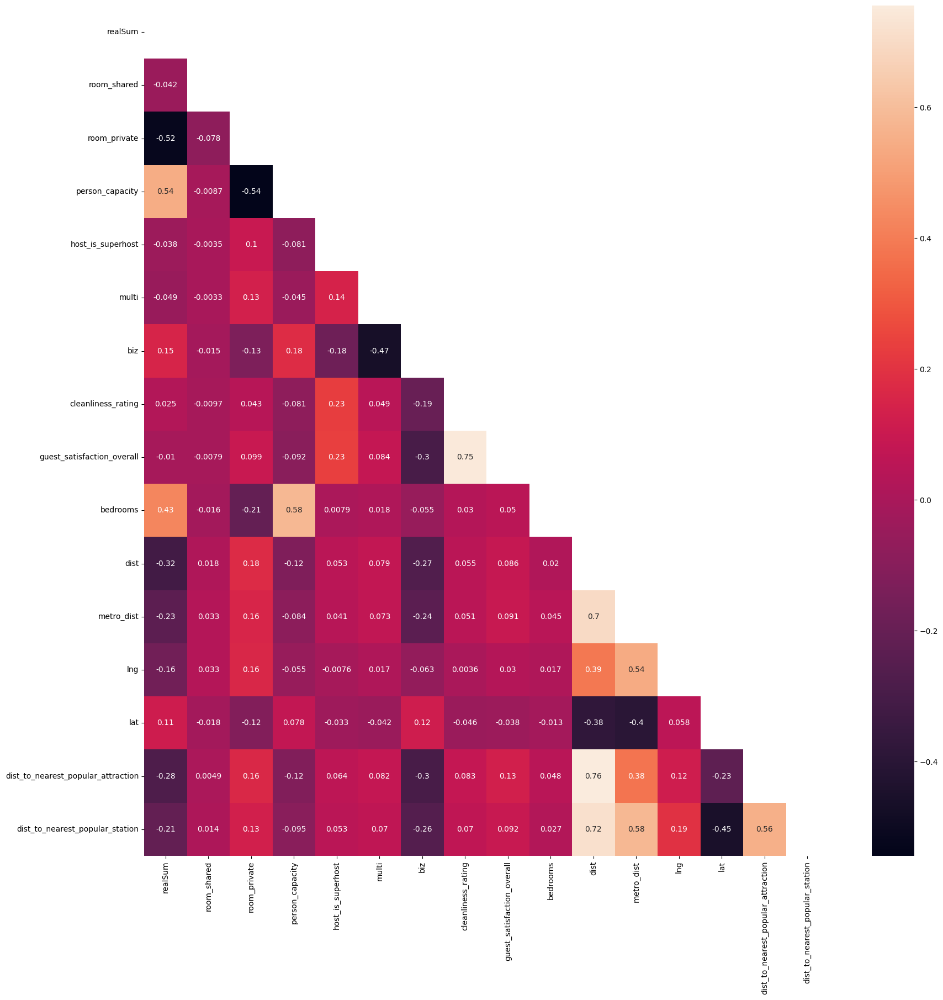

In [58]:
plt.rcParams['figure.figsize'] = (20,20)


corr = london_weekends_geo_counties.drop(['borough', 'room_type'], axis=1).corr()
trimask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask=trimask)

# Modelling

The borough column will probably not be used due to its high cardinality and the relative lack of data with respect to the high cardinality. Could possibly experiment with PCA for dimensionality reduction on it, but due to the nature of the boroughs it is unlikely to have a significant impact on the results.

In [59]:
SEED = 42
TARGET = 'realSum'
AUGMENTED_FEATURES = london_weekends_geo_counties.columns.drop(TARGET)
ORIGINAL_FEATURES = AUGMENTED_FEATURES.drop(['borough', 'dist_to_nearest_popular_attraction', 
                                             'dist_to_nearest_popular_station'])

AUGMENTED_NUMERICAL = london_weekends_geo_counties[AUGMENTED_FEATURES].select_dtypes('number').columns
ORIGINAL_NUMERICAL = london_weekends_geo_counties[ORIGINAL_FEATURES].select_dtypes('number').columns

AUGMENTED_CATEGORICAL = ['room_type', 'borough']
ORIGINAL_CATEGORICAL = ['room_type']

X = london_weekends_geo_counties[AUGMENTED_NUMERICAL]
y = london_weekends_geo_counties[TARGET]

X_train, X_rem, y_train, y_rem = train_test_split(X, y, test_size=0.3, random_state=SEED)
X_val, X_test, y_val, y_test = train_test_split(X_rem, y_rem, test_size=0.5, random_state=SEED)

In [60]:
#rmse function with sklearn

def calculate_rmse(model_pipe, X, y):
    y_pred = model_pipe.predict(X)
    return mean_squared_error(y, y_pred, squared=False)

### Linear Regression Baseline

In [61]:
# Baseline Model with Linear Regression

numerical_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', MinMaxScaler())
])

baseline_preprocessors = ColumnTransformer(transformers=[
    ('num', numerical_pipe, ORIGINAL_NUMERICAL),
])

baseline_pipe = Pipeline([
    ('preprocessors', baseline_preprocessors),
    ('model', LinearRegression())
])

baseline_pipe.fit(X_train, y_train)

print("Train RMSE: ", calculate_rmse(baseline_pipe, X_train, y_train))
print("Test RMSE: ", calculate_rmse(baseline_pipe, X_test, y_test))

Train RMSE:  211.97384206836017
Test RMSE:  181.24030618341575


### XGBoost

In [63]:
xgb = XGBRegressor()

xgb_params = { 
    'max_depth': [7, 8, 9],
    'learning_rate': [0.01],
    "min_split_loss":[0.5, 0.75, 1, 1.25],
    'n_estimators': [800, 900, 1000],
    "subsample":[0.5, 0.6, 0.7, 0.8],
    "colsample_bytree":[0.5],
    "early_stopping_rounds": [60]
}

xgb_grid = GridSearchCV(
    estimator = xgb,
    param_grid = xgb_params,
    scoring = 'neg_root_mean_squared_error',
    n_jobs = -1,
    cv = 5,
    verbose = 0,
)

xgb_grid.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=0)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.5],
                         'early_stopping_rounds': [60], 'learning_rate': [0.01],
                         'max_depth': [7, 8, 9],
                         'min_split_loss': [0.5, 0.75, 1, 1.25],
                         'n_estimators': [800, 900, 1000],
                         'subsample': [0.5, 0.6, 0.7, 0.8]},
             scoring='neg_root_mean_squared_error')

In [67]:
print("Test RMSE: ", -xgb_grid.score(X_test, y_test))
print("Train RMSE: ", -xgb_grid.score(X_train, y_train))
xgb_grid.best_params_

Test RMSE:  152.52010959792602
Train RMSE:  79.65907492397186


{'colsample_bytree': 0.5,
 'early_stopping_rounds': 60,
 'learning_rate': 0.01,
 'max_depth': 7,
 'min_split_loss': 0.75,
 'n_estimators': 1000,
 'subsample': 0.8}

While the RMSE is still fairly large, this is likely due to the small number of data points, including the small number of points towards the higher end of the AirBnB cost. However, XGBoost has reduced the RMSE by a considerable margin. While a significant range of parameters have been explored, more could potentially be explored, but would take up a significant amount of time.

<Axes: >

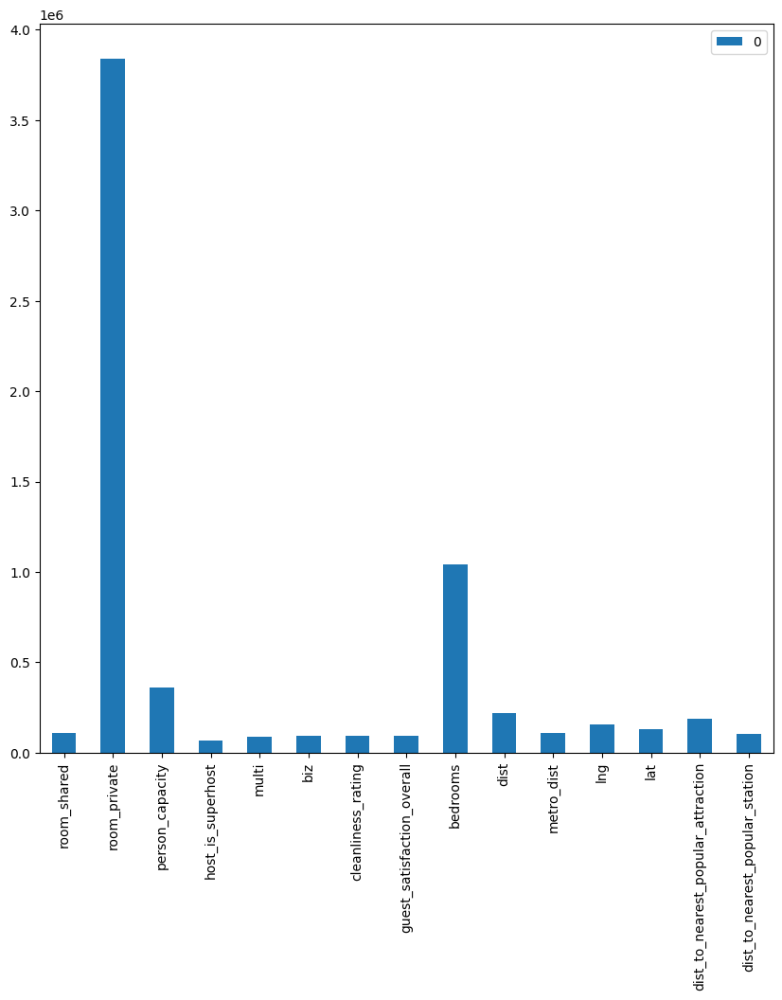

In [68]:
plt.rcParams['figure.figsize'] = (10,10)

xgb_1 = XGBRegressor(colsample_bytree = 0.5, early_stopping_rounds = 60, 
                     learning_rate = 0.01, max_depth = 7, min_split_loss = 0.75, 
                     n_estimators = 1000, subsample = 0.8)

xgb_1.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=0)
importance = xgb_1.get_booster().get_score(importance_type='gain')
importance_df = pd.DataFrame.from_dict(data=importance,
                                       orient='index')

importance_df.plot.bar()

As can be seen from the above, whether the booking is a private room, the number of bedrooms, and the capacity of the AirBnB are the most important concepts. As a possibility, to prevent extra columns from cluttering the neural network, the most important columns from XGBoost could be used as a guide for the columns to be used for the neural network.

### XGBoost with Categorical Type Handling

Since room_shared and room_private are the one-hot encoded version of room_type, we will try XGBoost's support for categorical data which uses optimal partitioning to see if it results in better results.

In [81]:
import warnings
warnings.filterwarnings('ignore')

NEW_COLS_LIST = ['room_type', 'person_capacity', 'host_is_superhost', 
                 'multi', 'biz', 'cleanliness_rating', 
                 'guest_satisfaction_overall', 'bedrooms', 'dist', 
                 'metro_dist', 'lng', 'lat', 
                 'dist_to_nearest_popular_attraction',
                 'dist_to_nearest_popular_station']

X_cat = london_weekends_geo_counties[NEW_COLS_LIST]
X_cat['room_type'] = X_cat['room_type'].astype("category")

y_cat = london_weekends_geo_counties[TARGET]

X_cat_train, X_cat_rem, y_cat_train, y_cat_rem = train_test_split(X_cat, y_cat, test_size=0.3, 
                                                                  random_state=SEED)
X_cat_val, X_cat_test, y_cat_val, y_cat_test = train_test_split(X_cat_rem, y_cat_rem, test_size=0.5, 
                                                                random_state=SEED)

In [82]:
xgb_cat = XGBRegressor(colsample_bytree = 0.5, early_stopping_rounds = 60, 
                     learning_rate = 0.01, max_depth = 7, min_split_loss = 0.75, 
                     n_estimators = 1000, subsample = 0.8, tree_method="hist", 
                     device="cuda", enable_categorical=True)

xgb_cat.fit(X_cat_train, y_cat_train, eval_set=[(X_cat_val, y_cat_val)], verbose=0)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5, device='cuda', early_stopping_rounds=60,
             enable_categorical=True, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, min_split_loss=0.75, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=1000,
             n_jobs=None, num_parallel_tree=None, ...)

In [84]:
print("Test RMSE: ", calculate_rmse(xgb_cat, X_cat_test, y_cat_test))
print("Train RMSE: ", calculate_rmse(xgb_cat, X_cat_train, y_cat_train))

Test RMSE:  153.11411425307136
Train RMSE:  77.19887503104732


With categorical type handling, the results are about the same. The train RMSE decreases slightly and the test RMSE increases slightly

<Axes: >

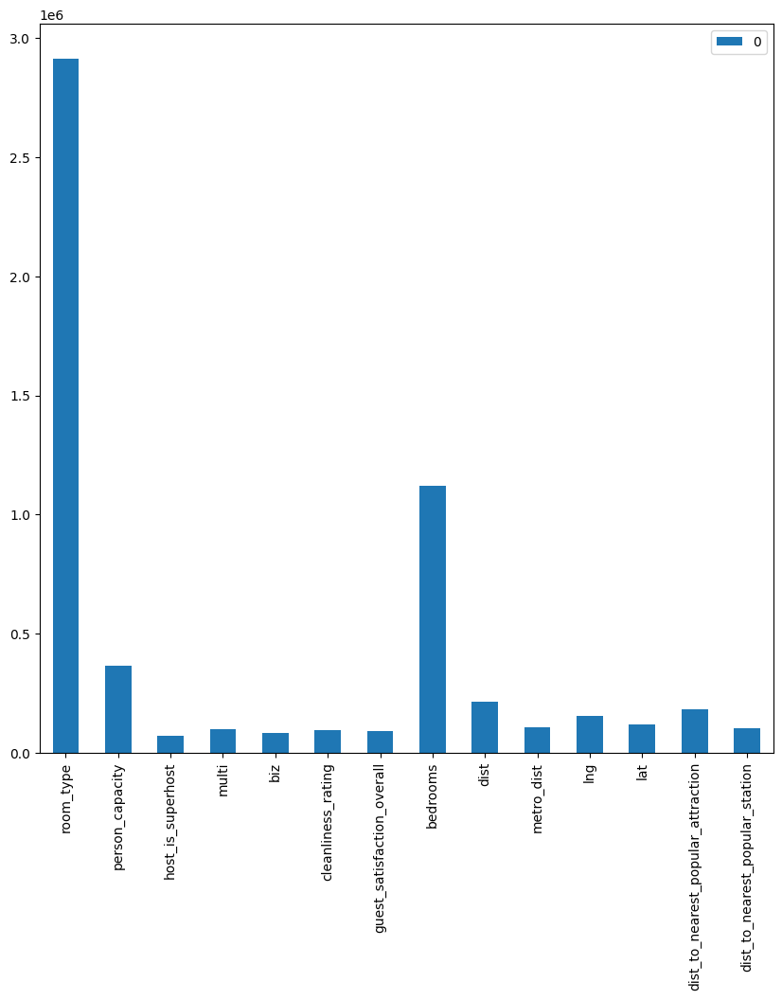

In [85]:
xgb_cat.fit(X_cat_train, y_cat_train, eval_set=[(X_cat_val, y_cat_val)], verbose=0)
importance = xgb_cat.get_booster().get_score(importance_type='gain')
importance_df = pd.DataFrame.from_dict(data=importance,
                                       orient='index')

importance_df.plot.bar()

### Neural Network (with Tensorflow)

In [87]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(X_train)

model = tf.keras.Sequential(
    [
        normalizer,
        tf.keras.layers.Dense(30, activation = 'relu'),
        tf.keras.layers.Dense(30, activation = 'relu'),
        tf.keras.layers.Dense(1, activation = 'relu')
    ]
)
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=tf.keras.metrics.RootMeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.01)
)

history = model.fit(X_train, y_train, epochs=500, validation_data=(X_val, y_val), verbose=0)

Text(0.5, 1.0, 'RMSE curves')

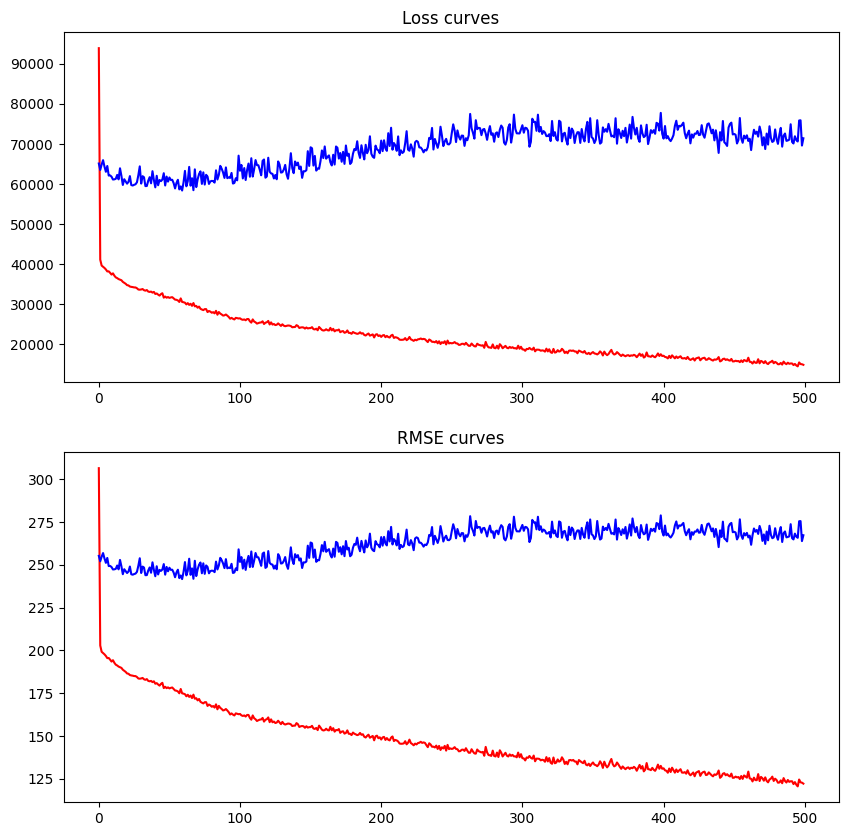

In [88]:
fig, ax = plt.subplots(2, 1)
ax[0].plot(history.history['loss'], color='r', label='train_MSE')
ax[0].plot(history.history['val_loss'], color='b', label='val_MSE')
ax[0].set_title("Loss curves")
ax[1].plot(history.history['root_mean_squared_error'], color='r', label='train_root_mean_squared_error')
ax[1].plot(history.history['val_root_mean_squared_error'], color='b', label='val_root_mean_squared_error')
ax[1].set_title("RMSE curves")

There is clear overfitting here as seen by the increase in validation loss. Need to find the epoch with the minimum validation error and refit.

In [89]:
optimal_epoch = history.history['val_loss'].index(min(history.history['val_loss']))
print("Optimal Epoch: ", optimal_epoch)

Optimal Epoch:  59


Refit and go again

In [90]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(X_train)

model = tf.keras.Sequential(
    [
        normalizer,
        tf.keras.layers.Dense(30, activation = 'relu'),
        tf.keras.layers.Dense(30, activation = 'relu'),
        tf.keras.layers.Dense(1, activation = 'relu')
    ]
)
model.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=tf.keras.metrics.RootMeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.01)
)

history = model.fit(X_train, y_train, epochs=optimal_epoch, validation_data=(X_val, y_val), verbose=0)

Text(0.5, 1.0, 'RMSE curves')

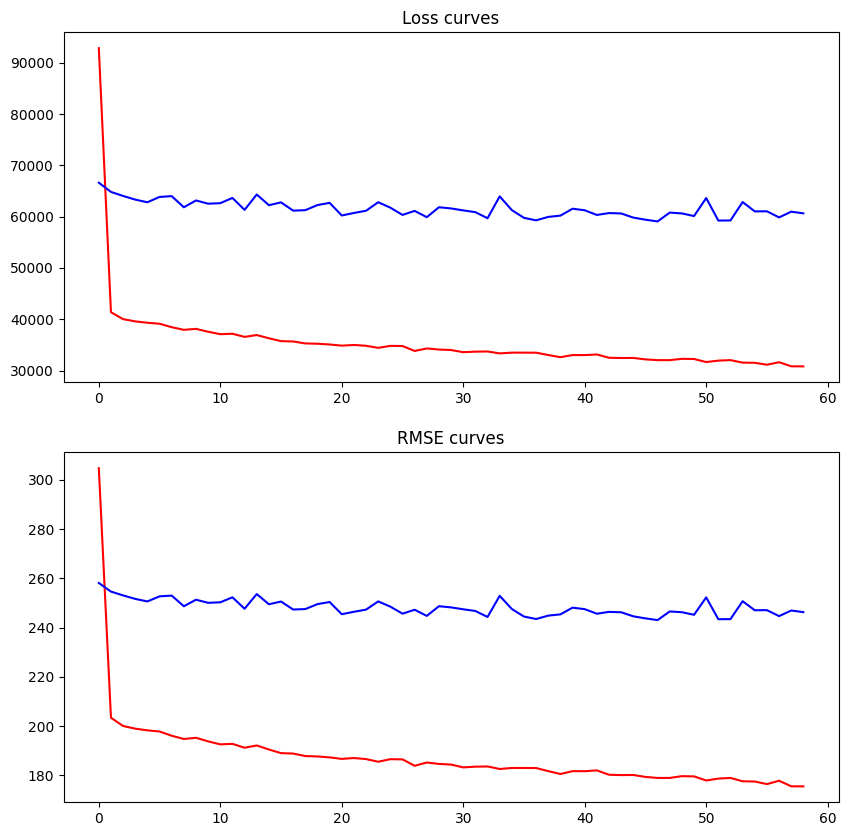

In [91]:
fig, ax = plt.subplots(2, 1)
ax[0].plot(history.history['loss'], color='r', label='train_MSE')
ax[0].plot(history.history['val_loss'], color='b', label='val_MSE')
ax[0].set_title("Loss curves")
ax[1].plot(history.history['root_mean_squared_error'], color='r', label='train_root_mean_squared_error')
ax[1].plot(history.history['val_root_mean_squared_error'], color='b', label='val_root_mean_squared_error')
ax[1].set_title("RMSE curves")

In [92]:
loss, RMSE = model.evaluate(X_test, y_test)
print("Loss: ", loss)
print("RMSE: ", np.sqrt(loss))

26/26 [==============================] - 0s 887us/step - loss: 26860.6191 - root_mean_squared_error: 163.8921
Loss:  26860.619140625
RMSE:  163.89209602853032


The RMSE of the neural network is higher than that of XGBoost. This is expected due to the superiority of XGBoost especially when the neural network is not large or particularly refined. More tuning can definitely be done to make the neural network better.

Further Work: Try Stacking Ensemble with Meta Learning Model